# IP-Adapter FaceID: Training-Free Identity Conditioning

This notebook is the first experiment in a four-method Stable Diffusion personalization study.

I start with IP-Adapter FaceID because it does not require identity-specific fine-tuning of the diffusion model. Instead, I extract a face embedding from a reference image and use it as an additional conditioning signal during generation.

I first test identity conditioning on its own, then combine it with OpenPose ControlNet to see how well the identity survives a stronger spatial constraint.


## 1. Setup


In [1]:
!git clone https://github.com/tencent-ailab/IP-Adapter.git


Cloning into 'IP-Adapter'...
remote: Enumerating objects: 497, done.
remote: Counting objects: 100% (195/195), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 497 (delta 170), reused 136 (delta 136), pack-reused 302 (from 2)
Receiving objects: 100% (497/497), 77.84 MiB | 8.73 MiB/s, done.
Resolving deltas: 100% (276/276), done.


In [1]:
import os, sys
sys.path.append("./IP-Adapter")

import requests
from io import BytesIO
from IPython.display import display

import cv2
from insightface.app import FaceAnalysis
import torch
from PIL import Image
import numpy as np

from huggingface_hub import hf_hub_download
from controlnet_aux import OpenposeDetector
from diffusers import AutoencoderKL, ControlNetModel
from diffusers import StableDiffusionPipeline, StableDiffusionControlNetPipeline, EulerAncestralDiscreteScheduler

from ip_adapter.ip_adapter_faceid_separate import IPAdapterFaceID

/home/jovyan/.local/lib/python3.12/site-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/home/jovyan/.local/lib/python3.12/site-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/home/jovyan/.local/lib/python3.12/site-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_11m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please che

In [2]:
device = torch.device("cuda")
dtype = torch.float16

app = FaceAnalysis(name="buffalo_l", providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))

/opt/conda/lib/python3.12/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/jovyan/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/jovyan/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/jovyan/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/jovyan/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/jovyan/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
se

## 2. Reference Identity Encoding

I use a single reference portrait and extract its normalized face embedding with InsightFace. This embedding is the identity signal passed to IP-Adapter FaceID.


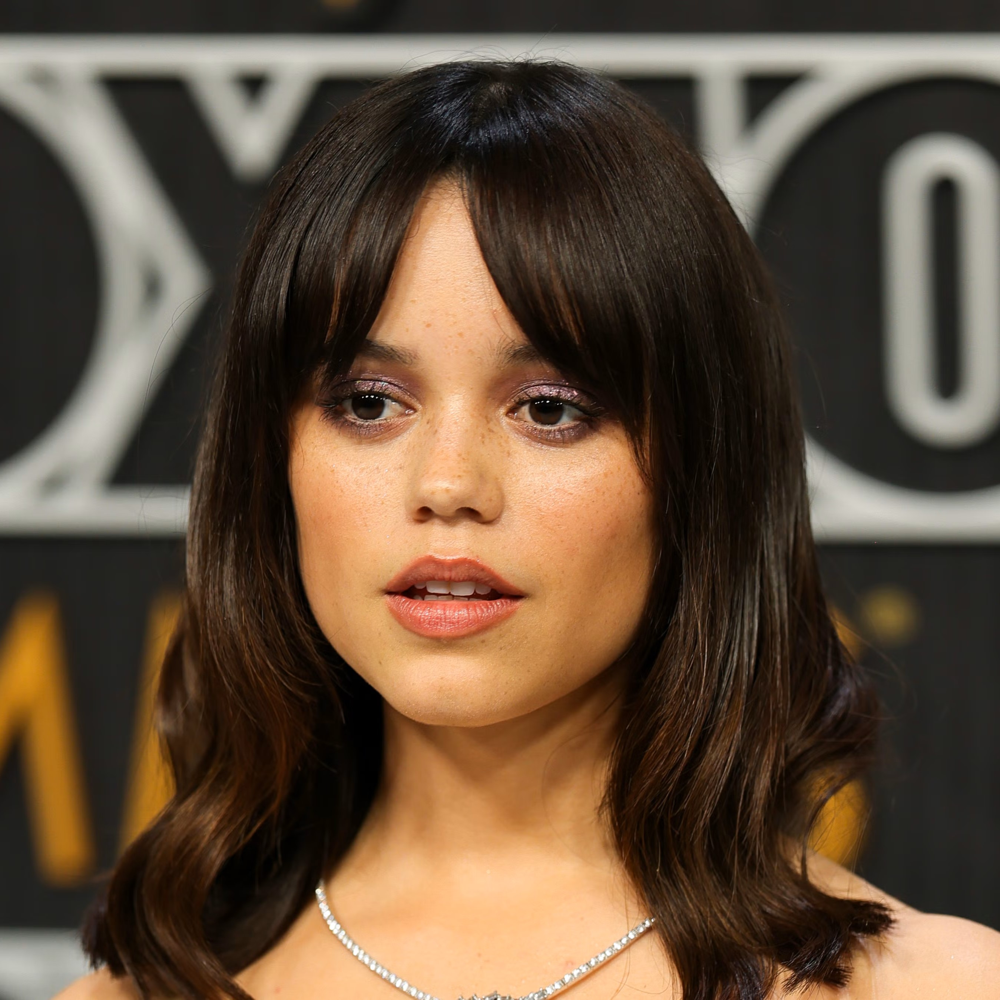

In [3]:
image = cv2.imread("./jortega/01.jpg")
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))


In [4]:
faces = app.get(image)
faceid_embeds = torch.from_numpy(faces[0].normed_embedding).unsqueeze(0)

/opt/conda/lib/python3.12/site-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


## 3. Identity-Conditioned Generation

I use Realistic Vision 5.1 as the base image generator and load the IP-Adapter FaceID weights together with the accompanying LoRA weights. The diffusion checkpoint itself is not fine-tuned for this identity.


In [5]:
pipe = StableDiffusionPipeline.from_pretrained(
    "SG161222/Realistic_Vision_V5.1_noVAE",
    vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=dtype, use_safetensors=True),
    torch_dtype=dtype,
    safety_checker=None,
    use_safetensors=True
).to(device, dtype)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [6]:
hf_hub_download(repo_id="h94/IP-Adapter-FaceID", filename="ip-adapter-faceid_sd15.bin", local_dir="./")
hf_hub_download(repo_id="h94/IP-Adapter-FaceID", filename="ip-adapter-faceid_sd15_lora.safetensors", local_dir="./")

pipe_scheduler_config = pipe.scheduler.config

pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe_scheduler_config)

pipe.load_lora_weights("ip-adapter-faceid_sd15_lora.safetensors")
pipe.fuse_lora()

ip_pipe = IPAdapterFaceID(pipe, "ip-adapter-faceid_sd15.bin", device)

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
/home/jovyan/hw/generative_cv_experiments/diffusion/personalization/IP-Adapter/ip_adapter/ip_adapter_faceid_separate.py:174: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no

  0%|          | 0/30 [00:00<?, ?it/s]

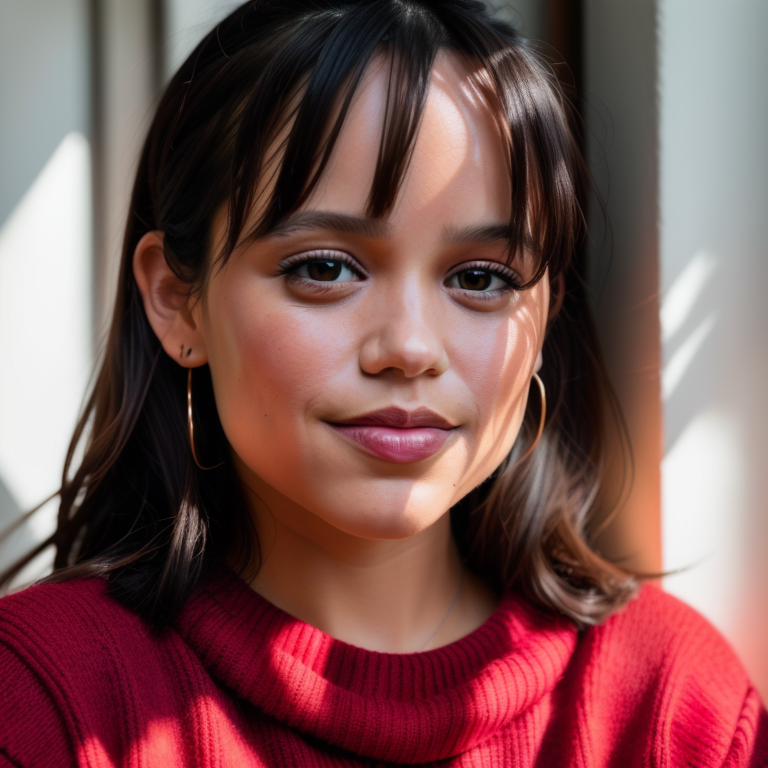

In [7]:
img = ip_pipe.generate(
    prompt="instagram photo, closeup face photo of jenna ortega in red sweater, pale skin, smile, hard shadows",
    negative_prompt="nsfw, naked, nude, deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers, deformed, distorted, disfigured, poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation",
    faceid_embeds=faceid_embeds,
    num_samples=1,
    height=768, width=768,
    num_inference_steps=30,
    guidance_scale=7.0,
    # generator=torch.Generator(device=device).manual_seed(1),
    seed=1
)[0]

img


### Observation

The unconstrained generation preserves the reference identity well while still allowing the text prompt to control appearance and lighting. This gives me a strong training-free baseline for the personalization methods that follow.


## 4. Pose-Controlled Generation

I add OpenPose ControlNet and keep FaceID conditioning active. This is a more difficult setting because the generation must satisfy both the reference identity and an external body-pose constraint.


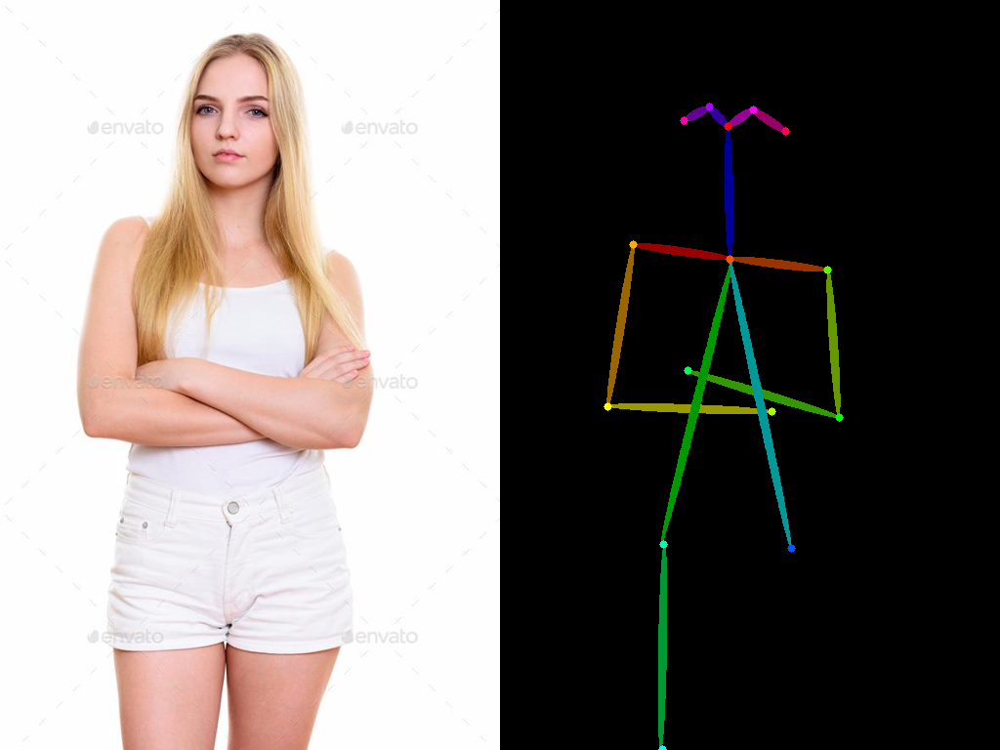

In [10]:
pose_detector = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

url = "https://s3.envato.com/files/287416893/23rdJanuary2017-4.jpg"

response = requests.get(url)
Image.open(BytesIO(response.content)).save("photo.jpg")

pose = pose_detector(Image.open("photo.jpg"))

Image.fromarray(np.hstack((np.asarray(Image.open("photo.jpg").resize((pose.width, pose.height))), np.asarray(pose),)))

In [11]:
controlnet_pose = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16).to(device)

In [12]:
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "SG161222/Realistic_Vision_V5.1_noVAE",
    controlnet=controlnet_pose,
    vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=dtype, use_safetensors=True),
    torch_dtype=dtype,
    safety_checker=None,
    use_safetensors=True
).to(device, dtype)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [13]:
pipe_scheduler_config = pipe.scheduler.config

pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe_scheduler_config)

pipe.load_lora_weights("ip-adapter-faceid_sd15_lora.safetensors")
pipe.fuse_lora()

ip_pipe = IPAdapterFaceID(pipe, "ip-adapter-faceid_sd15.bin", device)


No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


  0%|          | 0/50 [00:00<?, ?it/s]

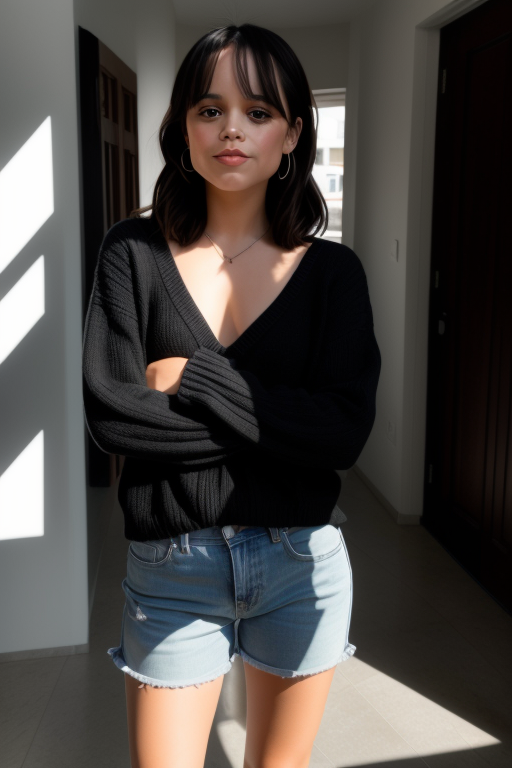

In [14]:
img = ip_pipe.generate(
    prompt="instagram photo, closeup face photo of jenna ortega in black sweater, pale skin, smile, hard shadows",
    negative_prompt="nsfw, nude, naked, deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers, deformed, distorted, disfigured, poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation",
    guidance_scale=3.0,
    faceid_embeds=faceid_embeds,
    num_samples=1,
    height=pose.height, width=pose.width,
    num_inference_steps=50,
    image=pose,
    seed=42)[0]

img


### Observation

The pose constraint changes the composition substantially and exact facial similarity becomes weaker, but the main identity cues remain recognizable. I use this same pose-controlled setting as a stress test in the other personalization experiments.
